<a href="https://colab.research.google.com/github/AfrifaEben7/ViT_part/blob/master/useg_ons.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Segmenting a single cell from a volume image

### Binary segmentation with Otsu thresholding

We read in the volume image used in Fig.1 of the paper and also create a savefolder to store the results of analysis.

In [ ]:
!pip install -q condacolab
# !pip install s3fs
import condacolab
condacolab.install()

!conda create -n unwrap3D python=3.9 -y
!conda activate unwrap3D

!pip install u-unwrap3D@git+https://github.com/DanuserLab/u-unwrap3D.git

In [ ]:
using_colab = True
from google.colab import drive
drive.mount('/content/drive')


if using_colab:
    import torch
    import torchvision
    # from ultralytics import YOLO
    !pip install ultralytics
    !pip install ipywidgets
    !pip install filterpy
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib

In [ ]:
# !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'
!pip install trimesh plotly
# !mkdir -p ../checkpoints/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 108.9 MB/s eta 0:00:00


In [ ]:
import skimage.io as skio
import pylab as plt
import tifffile
# import unwrap3D.Visualisation.volume_img as vol_img_viz # for creating a montage maximum projection
# import unwrap3D.Utility_Functions.file_io as fio # for common IO functions
import os

# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch

In [ ]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [ ]:
! cp -r /content/drive/MyDrive/CheckPOints/Six/train.yaml/checkpoints/sam2_refined_bplus.pt /checkpoints/
! ls /checkpoints/sam2_refined_bplus.pt

/checkpoints/sam2_refined_bplus.pt


In [ ]:
# !mkdir myvid

sam2_checkpoint = "../checkpoints/sam2_refined_bplus.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"

from sam2.build_sam import build_sam2_video_predictor

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device,

                                       hydra_overrides_extra=[
        "++model.sam_mask_decoder_extra_args.dynamic_multimask_via_stability=true",
    ],
)


def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

In [ ]:
output_folder = "myvid"
tif_file = "/content/drive/MyDrive/ColabNotebooks/Data/cell_CamB_ch0_stack0000_488nm_0000000msec_0002581605msecAbs_decon/cell_CamB_ch0_stack0000_488nm_0000000msec_0002581605msecAbs_decon.tif"
os.makedirs(output_folder, exist_ok=True)

stack = tifffile.imread(tif_file)
print("Original shape:", stack.shape)

stack = np.squeeze(stack)
while stack.ndim > 3:
    stack = np.squeeze(stack, axis=0)
print("Squeezed shape:", stack.shape)  # (Z, H, W)


for i, slice_img in enumerate(stack):
    if slice_img.dtype != np.uint8:
        min_val = slice_img.min()
        max_val = slice_img.max()
        if max_val - min_val > 0:
            normalized = ((slice_img - min_val) / (max_val - min_val) * 255).astype(np.uint8)
        else:
            normalized = np.zeros_like(slice_img, dtype=np.uint8)
    else:
        normalized = slice_img
    img = Image.fromarray(normalized)
    img.save(os.path.join(output_folder, f"{i:04d}.jpg"), "JPEG")

print("saved to:", output_folder)



Original shape: (150, 768, 930)
Squeezed shape: (150, 768, 930)
saved to: myvid


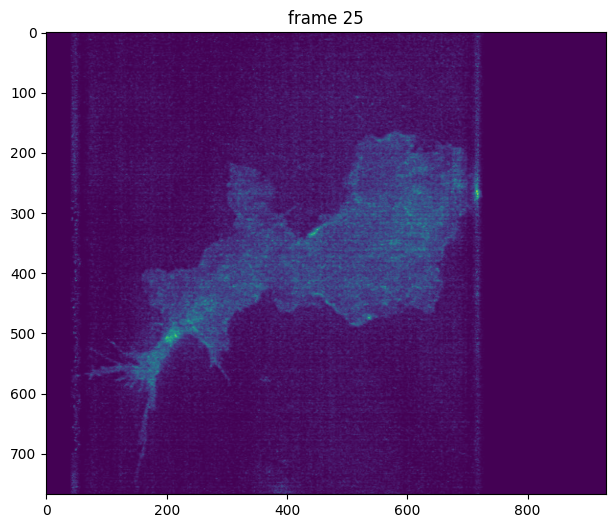

In [ ]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./myvid"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 25
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))


In [ ]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 768/768 [00:27<00:00, 27.68it/s]


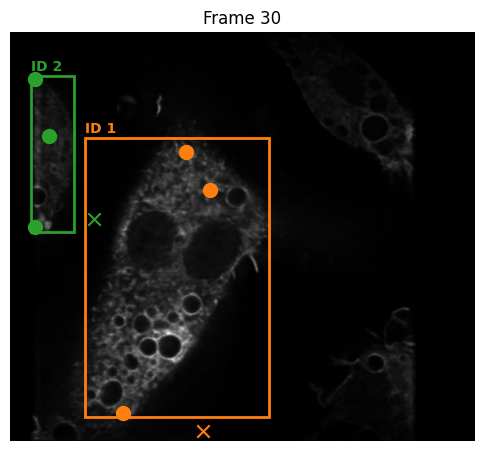

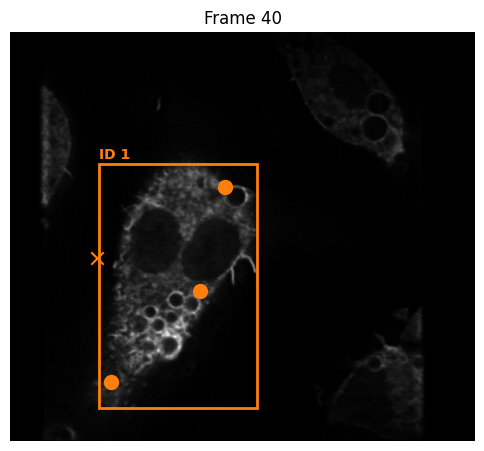

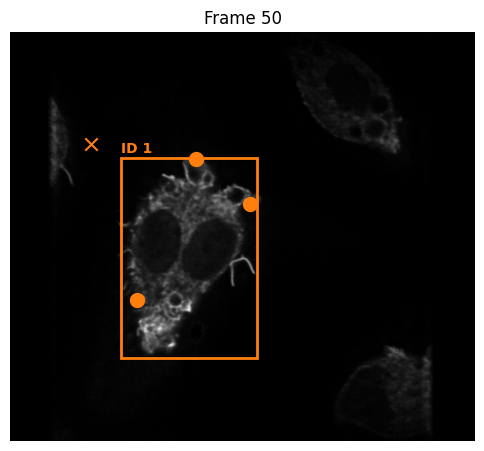

In [ ]:
from ultralytics import YOLO
import cv2, os, numpy as np, random, matplotlib.pyplot as plt
from sort import Sort

predictor.reset_state(inference_state)

yolo = YOLO('/content/drive/MyDrive/CheckPOints/two/train.yaml/checkpoints/yolo_best.pt')

start_idx, step = 20, 10
pad = 100

n_positive = 3
n_negative = 1
num_frames = 3

def points_cal(x1, y1, x2, y2, gray, n_positive=3, topk=20):
    patch = gray[y1:y2, x1:x2]
    h, w = patch.shape if patch.size else (0, 0)
    if h == 0 or w == 0:
        cx, cy = (x1+x2)//2, (y1+y2)//2
        return [[cx, cy] for _ in range(n_positive)]
    inv = cv2.bitwise_not(patch)
    _, mask = cv2.threshold(inv, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    ys, xs = np.where(mask > 0)
    if len(xs) == 0:
        cx, cy = (x1+x2)//2, (y1+y2)//2
        return [[cx, cy] for _ in range(n_positive)]
    vals = patch[ys, xs]
    topk_idx = np.argsort(vals)[-topk:]
    pts = np.array(list(zip(xs[topk_idx], ys[topk_idx])))  # (x, y) order

    # Select n_positive points as far apart
    if len(pts) < n_positive:
        pts_out = list(pts) + [pts[0].tolist()] * (n_positive - len(pts))
    else:
        selected = [pts[0]]
        pts_left = pts[1:]
        while len(selected) < n_positive:
            dists = [np.sum([np.linalg.norm(p - s) for s in selected]) for p in pts_left]
            idx = np.argmax(dists)
            selected.append(pts_left[idx])
            pts_left = np.delete(pts_left, idx, axis=0)
        pts_out = [p.tolist() for p in selected]
    points_img = [[x1 + int(px), y1 + int(py)] for (px, py) in pts_out]
    return points_img

def get_neg_points(x1, y1, x2, y2, gray, n_negative=1, pad=50):
    negs = []
    xmin, xmax = max(0, x1-pad), min(gray.shape[1], x2+pad)
    ymin, ymax = max(0, y1-pad), min(gray.shape[0], y2+pad)
    tries = 0
    while len(negs) < n_negative and tries < 100:
        nx = random.randint(xmin, xmax)
        ny = random.randint(ymin, ymax)
        if not (x1 <= nx <= x2 and y1 <= ny <= y2):
            negs.append([nx, ny])
        tries += 1
    if len(negs) < n_negative:
        negs += [negs[0]] * (n_negative - len(negs))
    return negs

# Reset SORT's internal state
try:
    # Method 1
    if hasattr(Sort, '_count'):
        Sort._count = 0
    if hasattr(Sort, 'count'):
        Sort.count = 0
except:
    pass

# Method 2
import sort
if hasattr(sort, 'KalmanBoxTracker'):
    if hasattr(sort.KalmanBoxTracker, 'count'):
        sort.KalmanBoxTracker.count = 0

found_frames = []
all_points_map = {}
boxes_map = {}

# Initialize tracker ONCE before the loop
tracker = Sort(max_age=10, min_hits=1, iou_threshold=0.3)

for idx in range(start_idx, len(frame_names), step):
    frame_idx = idx
    frame_path = os.path.join(video_dir, frame_names[frame_idx])
    bgr = cv2.imread(frame_path)
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    res = yolo(frame_path, imgsz=640, conf=0.80, iou=0.30, max_det=4, verbose=False)[0]
    boxes = res.boxes.xyxy.cpu().numpy()
    scores = res.boxes.conf.cpu().numpy()
    if boxes.shape[0] == 0:
        continue
    dets = np.hstack([boxes, scores[:, None]])

    # Use the same tracker instance throughout the loop
    tracks = tracker.update(dets)  # [x1, y1, x2, y2, track_id]
    all_points = {}
    for trk in tracks:
        x1, y1, x2, y2, track_id = trk.astype(int)
        pos_pts = points_cal(x1, y1, x2, y2, gray, n_positive=n_positive)
        negs = get_neg_points(x1, y1, x2, y2, gray, n_negative=n_negative, pad=pad)
        all_points[track_id] = {"positive": pos_pts, "negative": negs, "box": [x1, y1, x2, y2]}
    if all_points:
        found_frames.append(frame_idx)
        all_points_map[frame_idx] = all_points
        boxes_map[frame_idx] = [v["box"] for v in all_points.values()]
    if len(found_frames) == num_frames:
        break

if len(found_frames) < num_frames:
    raise RuntimeError(f"Could not find {num_frames} frames with detections")

cmap = plt.get_cmap("tab10")

for frame_idx in found_frames:
    points = all_points_map[frame_idx]
    boxes = boxes_map[frame_idx]
    frame_path = os.path.join(video_dir, frame_names[frame_idx])
    bgr = cv2.imread(frame_path)
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,6))
    plt.imshow(rgb)
    ax = plt.gca()
    for track_id, pts in points.items():
        x1, y1, x2, y2 = pts["box"]
        color = cmap(track_id % 10) # Use track_id to get a color from the colormap
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, edgecolor=color, fill=False, linewidth=2))
        ax.text(x1, y1-10, f'ID {track_id}', color=color, fontsize=10, weight='bold')
        for idx, p in enumerate(pts["positive"]):
            ax.scatter(p[0], p[1], c=[color], marker='o', s=100, label='pos' if idx == 0 else None)
        for idx, n in enumerate(pts["negative"]):
            ax.scatter(n[0], n[1], c=[color], marker='x', s=80, label='neg' if idx == 0 else None)
    plt.title(f"Frame {frame_idx}")
    plt.axis('off')
    plt.show()

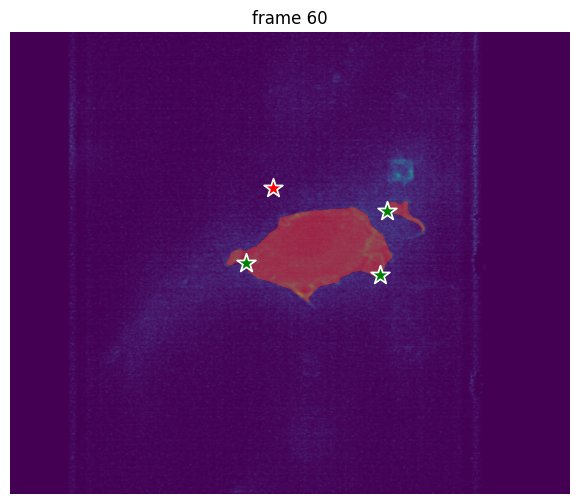

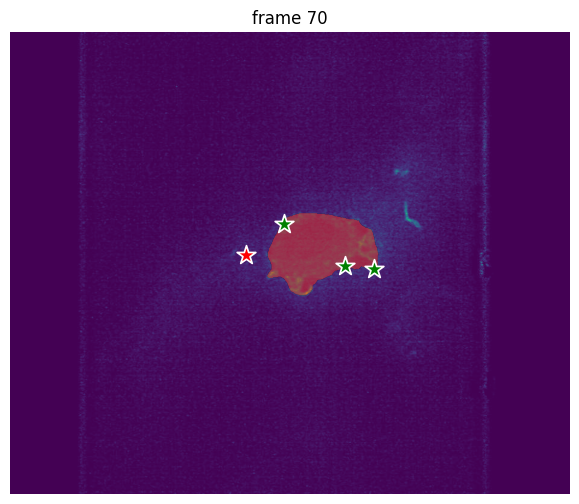

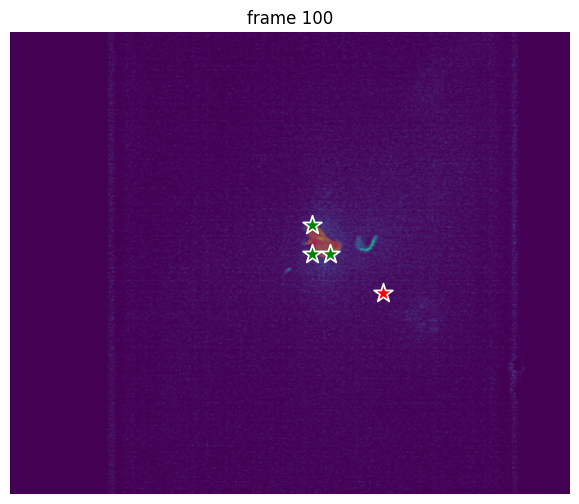

In [ ]:
use_box_prompt = False
predictor.reset_state(inference_state)


for ann_frame_idx in found_frames:
    all_points = all_points_map[ann_frame_idx]
    boxes = boxes_map[ann_frame_idx]

    prompts = {}
    count = 0
    while count < 5:
        for obj_id, pts in all_points.items():
            if use_box_prompt:
                x1, y1, x2, y2 = boxes[obj_id]
                prompts[obj_id] = {"box": np.array([x1, y1, x2, y2], dtype=np.float32)}
            else:
                pos_pts  = np.array(pts["positive"], dtype=np.float32)
                pos_labs = np.ones((pos_pts.shape[0],), dtype=np.int32)
                neg_pts  = np.array(pts["negative"], dtype=np.float32)
                neg_labs = np.zeros((neg_pts.shape[0],), dtype=np.int32)
                prompts[obj_id] = {
                    "points": np.vstack([pos_pts, neg_pts]),
                    "labels": np.hstack([pos_labs, neg_labs])
                }
        out_obj_ids = None
        out_mask_logits = None
        for obj_id, data in prompts.items():
            if "box" in data:
                _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
                    inference_state=inference_state,
                    frame_idx=ann_frame_idx,
                    obj_id=obj_id,
                    box=data["box"],
                )
            else:
                _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
                    inference_state=inference_state,
                    frame_idx=ann_frame_idx,
                    obj_id=obj_id,
                    points=data["points"],
                    labels=data["labels"],
                )
        count += 1

    plt.figure(figsize=(9,6))
    plt.title(f"frame {ann_frame_idx}")
    frame_img = Image.open(os.path.join(video_dir, frame_names[ann_frame_idx]))
    plt.imshow(frame_img)
    for obj_id, data in prompts.items():
        if "box" in data:
            show_box(data["box"], plt.gca())
        else:
            show_points(data["points"], data["labels"], plt.gca())
    if out_obj_ids is not None and out_mask_logits is not None:
        for i, out_obj_id in enumerate(out_obj_ids):
            mask = (out_mask_logits[i] > 0.0).cpu().numpy()
            show_mask(mask, plt.gca(), obj_id=out_obj_id)
    plt.axis('off')
    plt.show()

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
seed_frame_idx = ann_frame_idx
for fidx, obj_ids, logits in predictor.propagate_in_video(
    inference_state, reverse=True
):
    if fidx == seed_frame_idx:
        continue  # skip seed frame here
    video_segments[fidx] = {
        oid: (logits[i] > 0).cpu().numpy()
        for i, oid in enumerate(obj_ids)
    }


for fidx, obj_ids, logits in predictor.propagate_in_video(
    inference_state, reverse=False
):
    video_segments[fidx] = {
        oid: (logits[i] > 0).cpu().numpy()
        for i, oid in enumerate(obj_ids)
    }


propagate in video: 100%|██████████| 90/90 [00:59<00:00,  1.53it/s]


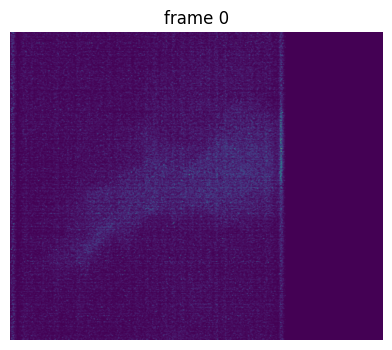

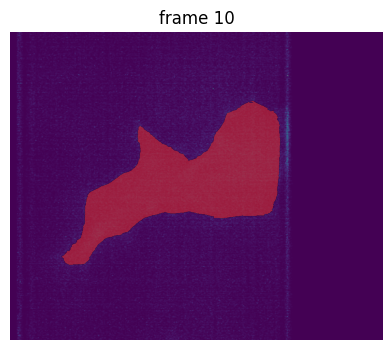

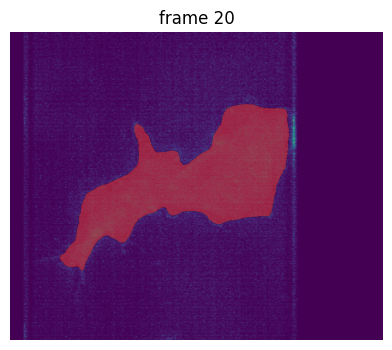

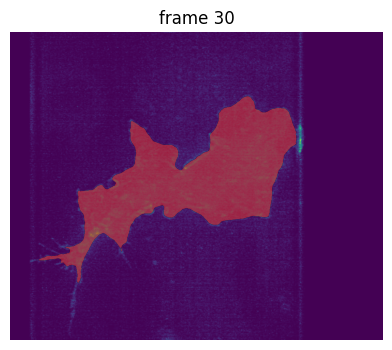

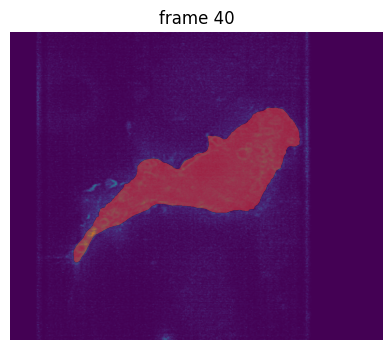

...

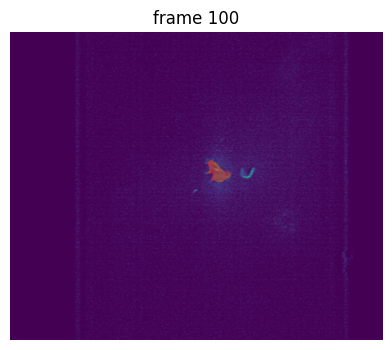

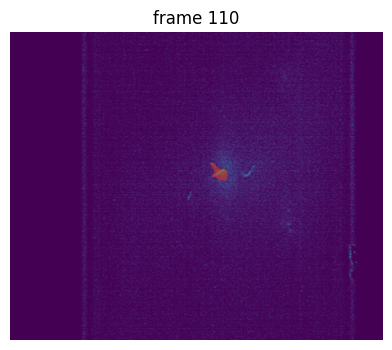

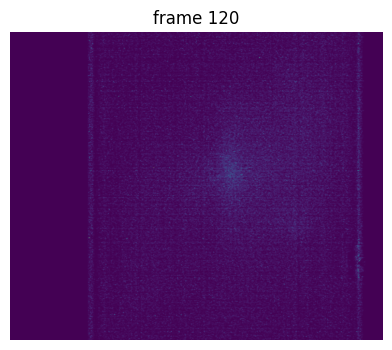

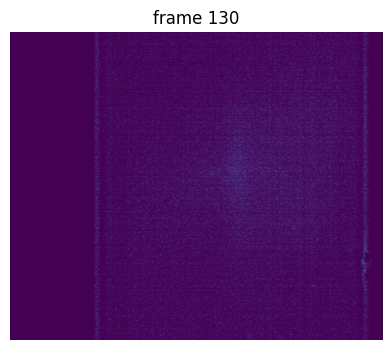

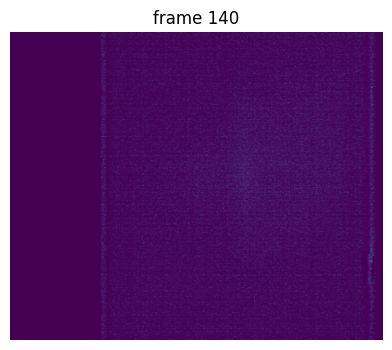

In [ ]:
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    if out_frame_idx in video_segments:  # Check if segmentation data exists for this frame
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
    plt.axis('off')
    plt.show()

In [ ]:
import imageio
from PIL import Image

basefname  = os.path.splitext(os.path.basename(tif_file))[0]
savefolder = os.path.join('/content/drive/MyDrive/ColabNotebooks/Data/Surface',
                          basefname)
os.makedirs(savefolder, exist_ok=True)
def convert_masks_to_tif(video_segments, output_path):
    frames = sorted(video_segments.keys())
    stack = []
    for idx in frames:
        mask = next(iter(video_segments[idx].values()))
        stack.append((mask * 255).astype(np.uint8))
    imageio.mimwrite(output_path, np.stack(stack, axis=0))
    print(f"Saved {len(stack)}-frame TIFF to {output_path}")

tif_output_path = os.path.join(savefolder, f"{basefname}.tif")
convert_masks_to_tif(video_segments, tif_output_path)

Saved 150-frame TIFF to /content/drive/MyDrive/ColabNotebooks/Data/Surface/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon.tif


In [ ]:
import imageio
import unwrap3D.Mesh.meshtools as meshtools
import unwrap3D.Image_Functions.image as image_fn
import unwrap3D.Visualisation.colors as vol_colors
from skimage.transform import resize
from matplotlib import cm


def extract_object_masks(video_segments):
    frames = sorted(video_segments.keys())
    # squeeze
    ref_mask = np.squeeze(next(iter(video_segments[frames[0]].values())))
    H, W = ref_mask.shape
    # object IDs
    obj_ids = sorted({oid for masks in video_segments.values() for oid in masks.keys()})
    # init
    obj_masks = {oid: np.zeros((len(frames), H, W), dtype=bool) for oid in obj_ids}
    # fill
    for t, f in enumerate(frames):
        masks = video_segments[f]
        for oid in obj_ids:
            m = masks.get(oid)
            if m is not None:
                obj_masks[oid][t] = np.squeeze(m).astype(bool)
    return obj_masks


voxel_size = 0.104  # µm

obj_masks = extract_object_masks(video_segments)

for obj_id, vol_mask in obj_masks.items():

    img_mask = np.pad(vol_mask, pad_width=5, mode='constant', constant_values=0)

    mesh = meshtools.marching_cubes_mesh_binary(
        img_mask.transpose(2,1,0),      # (Z,Y,X)
        presmooth=1.5,
        contourlevel=0.5,
        remesh=True,
        remesh_method='CGAL',
        remesh_samples=0.5,
        predecimate=False,
        min_mesh_size=10000,
        upsamplemethod='inplane'
    )


    fname_raw = f"curvature_binary_mesh_{basefname}_obj_{obj_id}.obj"
    mesh.export(os.path.join(savefolder, fname_raw))

    surf_H, (H_binary, H_sdf_vol_normal, H_sdf_vol) = meshtools.compute_mean_curvature_from_binary(
        mesh,
        img_mask.transpose(2,1,0),
        smooth_gradient=3,
        eps=1e-12,
        invert_H=False,
        return_H_img=True)

    surf_H_colors = vol_colors.get_colors(
        surf_H / voxel_size,
        colormap=cm.Spectral_r,
        vmin=-1.0,
        vmax=1.0
    )
    mesh.visual.vertex_colors = np.uint8(255 * surf_H_colors[..., :3])

    fname_col = f"PI3K_binary_mesh_{basefname}_obj_{obj_id}.obj"
    mesh.export(os.path.join(savefolder, fname_col))

    print(f"Object {obj_id}:")
    print(f"  Raw mesh - {fname_raw}")
    print(f"  Curvature‐colored mesh - {fname_col}")

Object 8:
  Raw mesh - curvature_binary_mesh_cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon_obj_8.obj
  Curvature‐colored mesh - PI3K_binary_mesh_cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon_obj_8.obj


In [ ]:
import trimesh

output_curv_all  = os.path.join(savefolder, f'{basefname}_curvature_all.obj')
output_pi3k_all  = os.path.join(savefolder, f'{basefname}_PI3K_all.obj')

paths = []
def merge_meshes(prefix, out_path):
    meshes = []
    for fname in sorted(os.listdir(savefolder)):
        if fname.startswith(prefix) and fname.endswith('.obj'):
            path = os.path.join(savefolder, fname)
            mesh = trimesh.load(path, force='mesh')
            # print(f'Loaded {fname}: {mesh.vertices.shape[0]} verts, {mesh.faces.shape[0]} faces')
            meshes.append(mesh)
    if not meshes:
        raise RuntimeError(f'No OBJ files found with prefix "{prefix}" in {savefolder}')
    combined = trimesh.util.concatenate(meshes)
    combined.export(out_path)
    paths.append(out_path)
    print(f'Exported combined mesh to: {out_path}')

merge_meshes(f'curvature_binary_mesh_{basefname}_obj_', output_curv_all)

merge_meshes(f'PI3K_binary_mesh_{basefname}_obj_', output_pi3k_all)

Exported combined mesh to: /content/drive/MyDrive/ColabNotebooks/Data/Surface/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon_curvature_all.obj
Exported combined mesh to: /content/drive/MyDrive/ColabNotebooks/Data/Surface/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon_PI3K_all.obj


In [ ]:
print(paths)

['/content/drive/MyDrive/ColabNotebooks/Data/Surface/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon_curvature_all.obj', '/content/drive/MyDrive/ColabNotebooks/Data/Surface/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon/cell_CamB_ch0_stack0007_488nm_0049279msec_0002630884msecAbs_decon_PI3K_all.obj']


In [ ]:
import plotly.graph_objects as go
import plotly.io as pio
import trimesh

pio.renderers.default = "colab"

obj_path = '/content/curvature_binary_mesh_cell_CamB_ch0_stack0000_488nm_0000000msec_0002581605msecAbs_decon_mask.obj'
mesh = trimesh.load(obj_path, force="mesh")


verts = mesh.vertices   # (N,3)
faces = mesh.faces      # (M,3)
x, y, z = verts.T
i, j, k = faces.T


fig = go.Figure(
    go.Mesh3d(
        x=x, y=y, z=z,
        i=i, j=j, k=k,
        vertexcolor=mesh.visual.vertex_colors if hasattr(mesh.visual, "vertex_colors") else None,
        opacity=1.0
    )
)
fig.update_layout(
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode="data"
    ),
    margin=dict(l=0, r=0, t=0, b=0)
)
fig.show()


# Task
Segment a single cell from a volume image using Otsu thresholding and save the results to a specified folder.

## Load the volume image

### Subtask:
Load the volume image into a suitable data structure for processing.


**Reasoning**:
The first step is to load the volume image from the specified path and prepare it for processing by squeezing any extra dimensions.

